<a href="https://colab.research.google.com/github/AsanAlacli/JSLABS/blob/main/kaggleDS_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import json

from google.colab import files

license_keys = files.upload()

with open(list(license_keys.keys())[0]) as f:
    license_keys = json.load(f)

Saving 3.1.0.spark_nlp_for_healthcare.txt to 3.1.0.spark_nlp_for_healthcare.txt


In [32]:
%%capture
for k,v in license_keys.items(): 
    %set_env $k=$v

!wget https://raw.githubusercontent.com/JohnSnowLabs/spark-nlp-workshop/master/jsl_colab_setup.sh
!bash jsl_colab_setup.sh

! pip install spark-nlp-display

In [34]:
import json
import os
from pyspark.ml import Pipeline,PipelineModel
from pyspark.sql import SparkSession

from sparknlp.annotator import *
from sparknlp_jsl.annotator import *
from sparknlp.base import *
import sparknlp_jsl
import sparknlp

params = {"spark.driver.memory":"16G",
"spark.kryoserializer.buffer.max":"2000M",
"spark.driver.maxResultSize":"2000M"}

spark = sparknlp_jsl.start(license_keys['SECRET'],params=params)

print ("Spark NLP Version :", sparknlp.version())
print ("Spark NLP_JSL Version :", sparknlp_jsl.version())

Spark NLP Version : 3.1.0
Spark NLP_JSL Version : 3.1.0


In [35]:
spark

In [5]:
import pandas as pd

In [10]:
from google.colab import files
files.upload()

Saving mtsamples.csv to mtsamples (1).csv


{'mtsamples.csv': b',description,medical_specialty,sample_name,transcription,keywords\n0, A 23-year-old white female presents with complaint of allergies., Allergy / Immunology, Allergic Rhinitis ,"SUBJECTIVE:,  This 23-year-old white female presents with complaint of allergies.  She used to have allergies when she lived in Seattle but she thinks they are worse here.  In the past, she has tried Claritin, and Zyrtec.  Both worked for short time but then seemed to lose effectiveness.  She has used Allegra also.  She used that last summer and she began using it again two weeks ago.  It does not appear to be working very well.  She has used over-the-counter sprays but no prescription nasal sprays.  She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS: , Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals:  Weight was 130 pounds and blood pressu

In [13]:
pandas_df=pd.read_csv('mtsamples (1).csv')
pd.set_option("display.max_colwidth", -1)
pandas_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


Unnamed: 0  ...                                                                                                                                                                                                                                                                                                                                 keywords
0     0           ...  allergy / immunology, allergic rhinitis, allergies, asthma, nasal sprays, rhinitis, nasal, erythematous, allegra, sprays, allergic,                                                                                                                                                                                                    
1     1           ...  bariatrics, laparoscopic gastric bypass, weight loss programs, gastric bypass, atkin's diet, weight watcher's, body weight, laparoscopic gastric, weight loss, pounds, months, weight, laparoscopic, band, loss, diets, overweight, lost                                                                                               
2     2           ...  bariatrics, laparoscopic gastric bypass, heart attacks, body weight, pulmonary embolism, potential complications, sleep study, weight loss, gastric bypass, anastomosis, loss, sleep, laparoscopic, gastric, bypass, heart, pounds, weight,                                                                                            
3     3           ...  cardiovascular / pulmonary, 2-d m-mode, doppler, aortic valve, atrial enlargement, diastolic function, ejection fraction, mitral, mitral valve, pericardial effusion, pulmonary valve, regurgitation, systolic function, tricuspid, tricuspid valve, normal lv                                                                         
4     4           ...  cardiovascular / pulmonary, 2-d, doppler, echocardiogram, annular, aortic root, aortic valve, atrial, atrium, calcification, cavity, ejection fraction, mitral, obliteration, outflow, regurgitation, relaxation pattern, stenosis, systolic function, tricuspid, valve, ventricular, ventricular cavity, wall motion, pulmonary artery
...  ..           ...                                                                                                                                                                                                                                                                                                                                      ...
4994  4994        ...  NaN                                                                                                                                                                                                                                                                                                                                    
4995  4995        ...  allergy / immunology, mucous membranes, conjunctivitis, ad lib, kawasaki disease, vaccine, fever, aspirin                                                                                                                                                                                                                              
4996  4996        ...  NaN                                                                                                                                                                                                                                                                                                                                    
4997  4997        ...  NaN                                                                                                                                                                                                                                                                                                                                    
4998  4998        ...  NaN                                                                                                                       

In [14]:
pandas_df.columns

Index(['Unnamed: 0', 'description', 'medical_specialty', 'sample_name',
       'transcription', 'keywords'],
      dtype='object')

In [15]:
df= pandas_df.loc[:,['medical_specialty', 'transcription']]
df

medical_specialty                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [16]:
df.shape

(4999, 2)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   medical_specialty  4999 non-null   object
 1   transcription      4966 non-null   object
dtypes: object(2)
memory usage: 78.2+ KB


In [18]:
df.describe()

,medical_specialty,transcription
count,4999,4966
unique,40,2357
top,Surgery,"PREOPERATIVE DIAGNOSIS: , Low back pain.,POSTOPERATIVE DIAGNOSIS: , Low back pain.,PROCEDURE PERFORMED:,1. Lumbar discogram L2-3.,2. Lumbar discogram L3-4.,3. Lumbar discogram L4-5.,4. Lumbar discogram L5-S1.,ANESTHESIA: ,IV sedation.,PROCEDURE IN DETAIL: ,The patient was brought to the Radiology Suite and placed prone onto a radiolucent table. The C-arm was brought into the operative field and AP, left right oblique and lateral fluoroscopic images of the L1-2 through L5-S1 levels were obtained. We then proceeded to prepare the low back with a Betadine solution and draped sterile. Using an oblique approach to the spine, the L5-S1 level was addressed using an oblique projection angled C-arm in order to allow for perpendicular penetration of the disc space. A metallic marker was then placed laterally and a needle entrance point was determined. A skin wheal was raised with 1% Xylocaine and an #18-gauge needle was advanced up to the level of the disc space using AP, oblique and lateral fluoroscopic projections. A second needle, #22-gauge 6-inch needle was then introduced into the disc space and with AP and lateral fluoroscopic projections, was placed into the center of the nucleus. We then proceeded to perform a similar placement of needles at the L4-5, L3-4 and L2-3 levels.,A solution of Isovue 300 with 1 gm of Ancef was then drawn into a 10 cc syringe and without informing the patient of our injecting, we then proceeded to inject the disc spaces sequentially."
freq,1103,5


In [19]:
df.isna().any()

medical_specialty    False
transcription        True 
dtype: bool

In [20]:
df.isnull().sum()

medical_specialty    0 
transcription        33
dtype: int64

In [22]:
df.medical_specialty.unique()

array([' Allergy / Immunology', ' Bariatrics',
       ' Cardiovascular / Pulmonary', ' Neurology', ' Dentistry',
       ' Urology', ' General Medicine', ' Surgery', ' Speech - Language',
       ' SOAP / Chart / Progress Notes', ' Sleep Medicine',
       ' Rheumatology', ' Radiology', ' Psychiatry / Psychology',
       ' Podiatry', ' Physical Medicine - Rehab',
       ' Pediatrics - Neonatal', ' Pain Management', ' Orthopedic',
       ' Ophthalmology', ' Office Notes', ' Obstetrics / Gynecology',
       ' Neurosurgery', ' Nephrology', ' Letters',
       ' Lab Medicine - Pathology', ' IME-QME-Work Comp etc.',
       ' Hospice - Palliative Care', ' Hematology - Oncology',
       ' Gastroenterology', ' ENT - Otolaryngology', ' Endocrinology',
       ' Emergency Room Reports', ' Discharge Summary',
       ' Diets and Nutritions', ' Dermatology',
       ' Cosmetic / Plastic Surgery', ' Consult - History and Phy.',
       ' Chiropractic', ' Autopsy'], dtype=object)

In [23]:
len(df.medical_specialty.unique())

40

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer 
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [25]:
def get_sentence_word_count(text_list):
    sent_count = 0
    word_count = 0
    vocab = {}
    for text in text_list:
        sentences=sent_tokenize(str(text).lower())
        sent_count = sent_count + len(sentences)
        for sentence in sentences:
            words=word_tokenize(sentence)
            for word in words:
                if(word in vocab.keys()):
                    vocab[word] = vocab[word] +1
                else:
                    vocab[word] =1 
    word_count = len(vocab.keys())
    return sent_count,word_count

In [26]:
clinical_text_df = pandas_df[pandas_df['transcription'].notna()]
sent_count,word_count= get_sentence_word_count(pandas_df['transcription'].tolist())
print("Number of sentences in transcriptions column: "+ str(sent_count))
print("Number of unique words in transcriptions column: "+str(word_count))



data_categories  = pandas_df.groupby(clinical_text_df['medical_specialty'])
i = 1
print('===========Original Categories =======================')
for catName,dataCategory in data_categories:
    print('Cat:'+str(i)+' '+catName + ' : '+ str(len(dataCategory)) )
    i = i+1
print('==================================')

Number of sentences in transcriptions column: 140247
Number of unique words in transcriptions column: 35834
===========Original Categories =======================
Cat:1  Allergy / Immunology : 7
Cat:2  Autopsy : 8
Cat:3  Bariatrics : 18
Cat:4  Cardiovascular / Pulmonary : 371
Cat:5  Chiropractic : 14
Cat:6  Consult - History and Phy. : 516
Cat:7  Cosmetic / Plastic Surgery : 27
Cat:8  Dentistry : 27
Cat:9  Dermatology : 29
Cat:10  Diets and Nutritions : 10
Cat:11  Discharge Summary : 108
Cat:12  ENT - Otolaryngology : 96
Cat:13  Emergency Room Reports : 75
Cat:14  Endocrinology : 19
Cat:15  Gastroenterology : 224
Cat:16  General Medicine : 259
Cat:17  Hematology - Oncology : 90
Cat:18  Hospice - Palliative Care : 6
Cat:19  IME-QME-Work Comp etc. : 16
Cat:20  Lab Medicine - Pathology : 8
Cat:21  Letters : 23
Cat:22  Nephrology : 81
Cat:23  Neurology : 223
Cat:24  Neurosurgery : 94
Cat:25  Obstetrics / Gynecology : 155
Cat:26  Office Notes : 50
Cat:27  Ophthalmology : 83
Cat:28  Orthoped

In [27]:
filtered_data_categories = data_categories.filter(lambda x:x.shape[0] > 10)
final_data_categories = filtered_data_categories.groupby(filtered_data_categories['medical_specialty'])
i=1
print('============Reduced Categories ======================')
for catName,dataCategory in final_data_categories:
    print('Cat:'+str(i)+' '+catName + ' : '+ str(len(dataCategory)) )
    i = i+1

print('============ Reduced Categories ======================')

============Reduced Categories ======================
Cat:1  Bariatrics : 18
Cat:2  Cardiovascular / Pulmonary : 371
Cat:3  Chiropractic : 14
Cat:4  Consult - History and Phy. : 516
Cat:5  Cosmetic / Plastic Surgery : 27
Cat:6  Dentistry : 27
Cat:7  Dermatology : 29
Cat:8  Discharge Summary : 108
Cat:9  ENT - Otolaryngology : 96
Cat:10  Emergency Room Reports : 75
Cat:11  Endocrinology : 19
Cat:12  Gastroenterology : 224
Cat:13  General Medicine : 259
Cat:14  Hematology - Oncology : 90
Cat:15  IME-QME-Work Comp etc. : 16
Cat:16  Letters : 23
Cat:17  Nephrology : 81
Cat:18  Neurology : 223
Cat:19  Neurosurgery : 94
Cat:20  Obstetrics / Gynecology : 155
Cat:21  Office Notes : 50
Cat:22  Ophthalmology : 83
Cat:23  Orthopedic : 355
Cat:24  Pain Management : 61
Cat:25  Pediatrics - Neonatal : 70
Cat:26  Physical Medicine - Rehab : 21
Cat:27  Podiatry : 47
Cat:28  Psychiatry / Psychology : 53
Cat:29  Radiology : 273
Cat:30  SOAP / Chart / Progress Notes : 166
Cat:31  Sleep Medicine : 20
Cat:

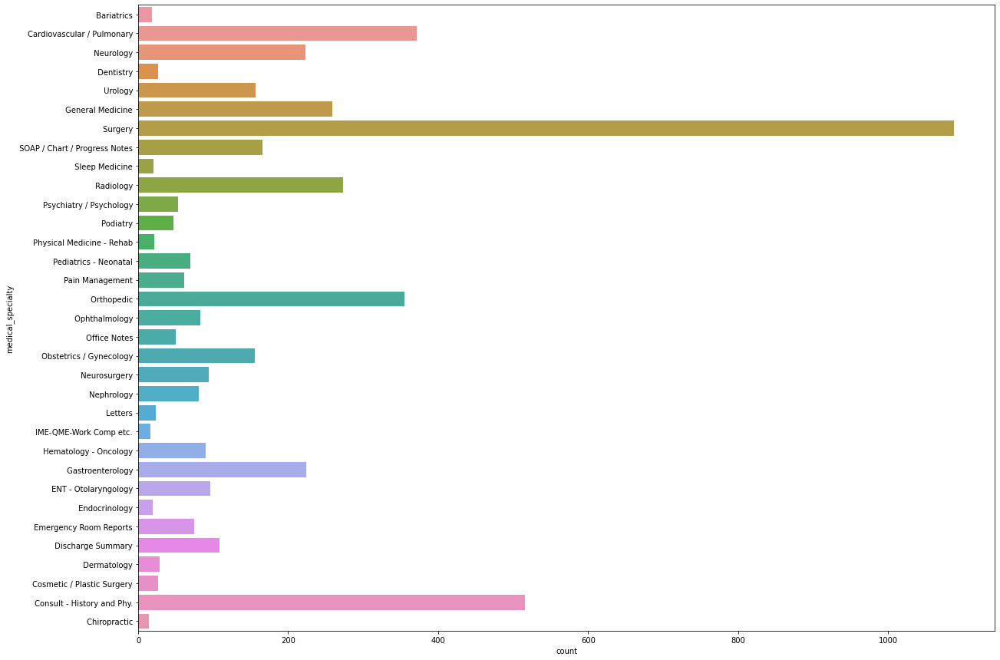

In [28]:
plt.figure(figsize=(20,15))
sns.countplot(y='medical_specialty', data = filtered_data_categories )
plt.show()

In [92]:

from sklearn.compose import make_column_transformer
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

column_trans = make_column_transformer(
     (TfidfVectorizer(max_features=100,  norm='l2', ngram_range=(1, 3)), 'transcription'),
     remainder=StandardScaler())

X = column_trans.fit_transform(df.transcription)

y = df.medical_specialty

IndexError: ignored

In [37]:
spark

In [65]:
documenter = DocumentAssembler()\
    .setInputCol("text")\
    .setOutputCol("document")

sentencer = SentenceDetector()\
    .setInputCols(["document"])\
    .setOutputCol("sentences")

tokenizer = sparknlp.annotators.Tokenizer()\
    .setInputCols(["sentences"])\
    .setOutputCol("tokens")

words_embedder = WordEmbeddingsModel()\
    .pretrained("embeddings_clinical", "en", "clinical/models")\
    .setInputCols(["sentences", "tokens"])\
    .setOutputCol("embeddings")


pipeline = Pipeline(stages=[
    documenter,
    sentencer,
    tokenizer, 
    words_embedder
])

empty_data = spark.createDataFrame([[""]]).toDF("text")

model = pipeline.fit(empty_data)


embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]


In [66]:
model.stages

[DocumentAssembler_991c70979645,
 SentenceDetector_9286afaaaffb,
 REGEX_TOKENIZER_51d9099bbb51,
 WORD_EMBEDDINGS_MODEL_9004b1d00302]

In [67]:
from pyspark.sql.types import StringType, IntegerType
spark_df= spark.createDataFrame(df.transcription, StringType()).toDF("text")

In [68]:
spark_df.show(truncate=280)

+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|                                                                                                                                                                                                                                                                                    text|
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|SUBJECTIVE:,  This 23-year-old white female presents with complaint of allergies.  She used to have allergies when she lived in Seattle but she thinks

In [50]:
df.transcription

0       SUBJECTIVE:,  This 23-year-old white female presents with complaint of allergies.  She used to have allergies when she lived in Seattle but she thinks they are worse here.  In the past, she has tried Claritin, and Zyrtec.  Both worked for short time but then seemed to lose effectiveness.  She has used Allegra also.  She used that last summer and she began using it again two weeks ago.  It does not appear to be working very well.  She has used over-the-counter sprays but no prescription nasal sprays.  She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS: , Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals:  Weight was 130 pounds and blood pressure 124/78.,HEENT:  Her throat was mildly erythematous without exudate.  Nasal mucosa was erythematous and swollen.  Only clear drainage was seen.  TMs were clear.,Neck:  Supple without adeno

In [76]:
from sparknlp.base import *

documentAssembler = DocumentAssembler()\
      .setInputCol("text")\
      .setOutputCol("document")\
      .setCleanupMode("shrink")

doc_df = documentAssembler.transform(spark_df)

doc_df.show(truncate=90)

+------------------------------------------------------------------------------------------+------------------------------------------------------------------------------------------+
|                                                                                      text|                                                                                  document|
+------------------------------------------------------------------------------------------+------------------------------------------------------------------------------------------+
|SUBJECTIVE:,  This 23-year-old white female presents with complaint of allergies.  She ...|[{document, 0, 1308, SUBJECTIVE:, This 23-year-old white female presents with complaint...|
|PAST MEDICAL HISTORY:, He has difficulty climbing stairs, difficulty with airline seats...|[{document, 0, 2405, PAST MEDICAL HISTORY:, He has difficulty climbing stairs, difficul...|
|HISTORY OF PRESENT ILLNESS: , I have seen ABC today.  He is a very pleasant gen

In [78]:
doc_df.select('document.result','document.begin','document.end').show(truncate=100)

+----------------------------------------------------------------------------------------------------+-----+------+
|                                                                                              result|begin|   end|
+----------------------------------------------------------------------------------------------------+-----+------+
|[SUBJECTIVE:, This 23-year-old white female presents with complaint of allergies. She used to hav...|  [0]|[1308]|
|[PAST MEDICAL HISTORY:, He has difficulty climbing stairs, difficulty with airline seats, tying s...|  [0]|[2405]|
|[HISTORY OF PRESENT ILLNESS: , I have seen ABC today. He is a very pleasant gentleman who is 42 y...|  [0]|[4363]|
|[2-D M-MODE: , ,1. Left atrial enlargement with left atrial diameter of 4.7 cm.,2. Normal size ri...|  [0]| [485]|
|[1. The left ventricular cavity size and wall thickness appear normal. The wall motion and left v...|  [0]|[1600]|
|[PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Mo

In [79]:
from sparknlp.annotator import *

# we feed the document column coming from Document Assembler

sentenceDetector = SentenceDetector()\
    .setInputCols(['document'])\
    .setOutputCol('sentences')

In [82]:
doc_df.show(truncate=200)

+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|                                                                                                                                                                                                    text|                                                                                                                                                                                                document|
+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [69]:
lmodel = LightPipeline(model)
results = lmodel.fullAnnotate("text")

In [70]:
results[0].keys()

dict_keys(['document', 'sentences', 'tokens', 'embeddings'])

In [71]:
results[0]['embeddings']

[Annotation(word_embeddings, 0, 3, text, {'isOOV': 'false', 'pieceId': '-1', 'isWordStart': 'true', 'token': 'text', 'sentence': '0'})]

In [74]:
results[0]['tokens']

[Annotation(token, 0, 3, text, {'sentence': '0'})]

In [73]:
len(results[0]['tokens'])

1

In [61]:
for rel in results[0]["relations"]:
    print("{}({}={} - {}={})".format(
        rel.result, 
        rel.metadata['entity1'], 
        rel.metadata['chunk1'], 
        rel.metadata['entity2'],
        rel.metadata['chunk2']
    ))

DRUG-FORM(DRUG=Nasonex - FORM=sprays)
DRUG-ROUTE(DRUG=Nasonex - ROUTE=each nostril)
DRUG-DURATION(DRUG=Nasonex - DURATION=for three weeks)


In [62]:
def get_relations_df (results, col='relations'):
  rel_pairs=[]
  for rel in results[0][col]:
      rel_pairs.append((
          rel.result, 
          rel.metadata['entity1'], 
          rel.metadata['entity1_begin'],
          rel.metadata['entity1_end'],
          rel.metadata['chunk1'], 
          rel.metadata['entity2'],
          rel.metadata['entity2_begin'],
          rel.metadata['entity2_end'],
          rel.metadata['chunk2'], 
          rel.metadata['confidence']
      ))

  rel_df = pd.DataFrame(rel_pairs, columns=['relation','entity1','entity1_begin','entity1_end','chunk1','entity2','entity2_begin','entity2_end','chunk2', 'confidence'])

  return rel_df


rel_df = get_relations_df (results)

rel_df

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,DRUG-FORM,DRUG,1237,1243,Nasonex,FORM,1249,1254,sprays,1.0
1,DRUG-ROUTE,DRUG,1237,1243,Nasonex,ROUTE,1259,1270,each nostril,1.0
2,DRUG-DURATION,DRUG,1237,1243,Nasonex,DURATION,1278,1292,for three weeks,1.0


In [63]:
len(rel_df)

3

In [64]:
from sparknlp_display import RelationExtractionVisualizer


vis = RelationExtractionVisualizer()
vis.display(results[0], 'relations', show_relations=True) # default show_relations: True

/usr/local/lib/python3.7/dist-packages/sparknlp_display/relation_extraction.py:366: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  relation_coordinates = np.array(relation_coordinates)


In [67]:
results[0]['ner_tags']

[Annotation(named_entity, 0, 9, O, {'B-DRUG': '9.0E-4', 'B-STRENGTH': '0.001', 'I-DURATION': '2.0E-4', 'I-STRENGTH': '3.0E-4', 'I-FREQUENCY': '2.0E-4', 'B-FORM': '0.0651', 'B-DOSAGE': '9.0E-4', 'I-DOSAGE': '1.0E-4', 'I-DRUG': '6.0E-4', 'I-ROUTE': '0.0', 'B-ROUTE': '2.0E-4', 'word': 'SUBJECTIVE', 'O': '0.9271', 'B-DURATION': '1.0E-4', 'B-FREQUENCY': '0.0', 'I-FORM': '0.0033'}),
 Annotation(named_entity, 10, 11, O, {'B-DRUG': '1.0E-4', 'B-STRENGTH': '5.0E-4', 'I-DURATION': '5.0E-4', 'I-STRENGTH': '0.0024', 'I-FREQUENCY': '0.0013', 'B-FORM': '0.0', 'B-DOSAGE': '4.0E-4', 'I-DOSAGE': '0.0015', 'I-DRUG': '0.0011', 'I-ROUTE': '0.0', 'B-ROUTE': '0.0', 'word': ':,', 'O': '0.9916', 'B-DURATION': '0.0', 'B-FREQUENCY': '0.0', 'I-FORM': '6.0E-4'}),
 Annotation(named_entity, 14, 17, O, {'B-DRUG': '0.0', 'B-STRENGTH': '0.0', 'I-DURATION': '0.0037', 'I-STRENGTH': '0.0185', 'I-FREQUENCY': '0.0254', 'B-FORM': '0.0', 'B-DOSAGE': '0.0', 'I-DOSAGE': '0.0215', 'I-DRUG': '0.0024', 'I-ROUTE': '1.0E-4', 'B-ROU

In [ ]:
clinical_ner_tagger = MedicalNerModel()\
    .pretrained("ner_clinical", "en", "clinical/models")\
    .setInputCols("sentences", "tokens", "embeddings")\
    .setOutputCol("ner_tags")    

clinical_re_Model = RelationExtractionModel()\
    .pretrained("re_clinical", "en", 'clinical/models')\
    .setInputCols(["embeddings", "pos_tags", "ner_chunks", "dependencies"])\
    .setOutputCol("relations")\
    .setMaxSyntacticDistance(4)\
    .setRelationPairs(["problem-test", "problem-treatment"]) # we can set the possible relation pairs (if not set, all the relations will be calculated)

pipeline = Pipeline(stages=[
    documenter,
    sentencer,
    tokenizer, 
    words_embedder, 
    pos_tagger, 
    clinical_ner_tagger,
    ner_chunker,
    dependency_parser,
    clinical_re_Model
])


empty_data = spark.createDataFrame([[""]]).toDF("text")

model = pipeline.fit(empty_data)

ner_clinical download started this may take some time.
Approximate size to download 13.9 MB
[OK!]
re_clinical download started this may take some time.
Approximate size to download 6 MB
[OK!]


In [ ]:
lmodel = LightPipeline(model)
annotations = lmodel.fullAnnotate(text)

rel_df1 = get_relations_df (annotations)

rel_df1[rel_df1.relation!="O"]

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
8,TrAP,PROBLEM,1163,1165,CVA,TREATMENT,1176,1185,ASA/plavix,0.86630833
11,TeRP,TEST,1272,1282,bronchscopy,PROBLEM,1323,1337,malignant cells,0.996745
12,TeRP,TEST,1549,1559,Lung biopsy,PROBLEM,1580,1596,a large Bcell NHL,0.99402547
13,TeRP,PROBLEM,2165,2185,decreased attenuation,TEST,2206,2219,the prior exam,0.99115014
15,TeRP,PROBLEM,2567,2595,stomach and intestinal cancer,TEST,2669,2670,VS,0.9999999
22,TeRP,PROBLEM,2754,2787,conjunctivae anicteric/noninjected,TEST,2814,2816,JVP,0.999997
28,TeRP,PROBLEM,5319,5325,hypoxic,TEST,5338,5340,CXR,0.99431425
35,TeRP,PROBLEM,5544,5559,flash pulm edema,TREATMENT,5570,5578,intubated,0.99085766
38,TrAP,PROBLEM,5828,5835,diarrhea,TEST,5858,5866,a lactate,0.58548725
40,TeRP,PROBLEM,5911,5939,hypoxic respiratory failure,TREATMENT,5945,5953,intubated,0.9862671


In [ ]:
events_ner_tagger = MedicalNerModel()\
    .pretrained("ner_events_clinical", "en", "clinical/models")\
    .setInputCols("sentences", "tokens", "embeddings")\
    .setOutputCol("ner_tags")    

clinical_re_Model = RelationExtractionModel()\
    .pretrained("re_temporal_events_clinical", "en", 'clinical/models')\
    .setInputCols(["embeddings", "pos_tags", "ner_chunks", "dependencies"])\
    .setOutputCol("relations")\
    .setMaxSyntacticDistance(4)\
    .setPredictionThreshold(0.9)

pipeline = Pipeline(stages=[
    documenter,
    sentencer,
    tokenizer, 
    words_embedder, 
    pos_tagger, 
    events_ner_tagger,
    ner_chunker,
    dependency_parser,
    clinical_re_Model
])

empty_data = spark.createDataFrame([[""]]).toDF("text")

model = pipeline.fit(empty_data)

ner_events_clinical download started this may take some time.
Approximate size to download 13.8 MB
[OK!]
re_temporal_events_clinical download started this may take some time.
Approximate size to download 5.9 MB
[OK!]


In [ ]:
events_ner_tagger.getClasses()

['O',
 'B-OCCURRENCE',
 'B-DATE',
 'B-PROBLEM',
 'I-PROBLEM',
 'B-DURATION',
 'I-DURATION',
 'B-EVIDENTIAL',
 'I-OCCURRENCE',
 'B-TREATMENT',
 'I-TREATMENT',
 'I-DATE',
 'B-TEST',
 'I-TEST',
 'B-CLINICAL_DEPT',
 'I-CLINICAL_DEPT',
 'B-FREQUENCY',
 'I-FREQUENCY',
 'I-EVIDENTIAL',
 'B-TIME',
 'I-TIME']

In [ ]:
lmodel = LightPipeline(model)
annotations = lmodel.fullAnnotate(text)

rel_df2 = get_relations_df (annotations)

rel_df2 = rel_df2[(rel_df2.relation!="O")]

rel_df2

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,OCCURRENCE,0,8,Admission,DATE,17,31,[**2191-4-18**],1.0
1,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,46,54,Discharge,1.0
2,OVERLAP,DATE,17,31,[**2191-4-18**],OCCURRENCE,46,54,Discharge,0.9914493
3,OVERLAP,TREATMENT,179,189,Ceftriaxone,PROBLEM,255,263,Pneumonia,0.9547989
4,OVERLAP,OCCURRENCE,222,223,LF,PROBLEM,255,263,Pneumonia,0.99990416
...,...,...,...,...,...,...,...,...,...,...
262,OVERLAP,OCCURRENCE,8477,8485,Admission,TREATMENT,8504,8511,atenolol,0.9998721
263,OVERLAP,TREATMENT,8490,8496,Lipitor,TREATMENT,8504,8511,atenolol,1.0
264,OVERLAP,TREATMENT,8504,8511,atenolol,FREQUENCY,8524,8525,qd,1.0
265,OVERLAP,TREATMENT,8528,8533,L-dopa,FREQUENCY,8542,8544,tid,1.0


In [ ]:
annotations = lmodel.fullAnnotate(text)

rel_df3 = get_relations_df (annotations)

rel_df3.confidence = rel_df3.confidence.astype(float)

rel_df3 = rel_df3[(rel_df3.relation!="O")]

rel_df3[(rel_df3.relation!="O")&(rel_df3.entity1!=rel_df3.entity2)]

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,OCCURRENCE,0,8,Admission,DATE,17,31,[**2191-4-18**],1.000000
2,OVERLAP,DATE,17,31,[**2191-4-18**],OCCURRENCE,46,54,Discharge,0.991449
3,OVERLAP,TREATMENT,179,189,Ceftriaxone,PROBLEM,255,263,Pneumonia,0.954799
4,OVERLAP,OCCURRENCE,222,223,LF,PROBLEM,255,263,Pneumonia,0.999904
5,OVERLAP,OCCURRENCE,375,383,diagnosed,PROBLEM,390,398,[**Doctor,1.000000
...,...,...,...,...,...,...,...,...,...,...
261,OVERLAP,OCCURRENCE,8477,8485,Admission,TREATMENT,8490,8496,Lipitor,0.999998
262,OVERLAP,OCCURRENCE,8477,8485,Admission,TREATMENT,8504,8511,atenolol,0.999872
264,OVERLAP,TREATMENT,8504,8511,atenolol,FREQUENCY,8524,8525,qd,1.000000
265,OVERLAP,TREATMENT,8528,8533,L-dopa,FREQUENCY,8542,8544,tid,1.000000


# Admission-Discharge Events Exraction

In [ ]:
events_admission_ner_tagger = MedicalNerModel()\
    .pretrained("ner_events_admission_clinical", "en", "clinical/models")\
    .setInputCols("sentences", "tokens", "embeddings")\
    .setOutputCol("ner_tags")    

pipeline = Pipeline(stages=[
    documenter,
    sentencer,
    tokenizer, 
    words_embedder, 
    pos_tagger, 
    events_admission_ner_tagger,
    ner_chunker,
    dependency_parser,
    clinical_re_Model
])

empty_data = spark.createDataFrame([[""]]).toDF("text")

model = pipeline.fit(empty_data)

ner_events_admission_clinical download started this may take some time.
Approximate size to download 14.5 MB
[OK!]


In [ ]:
events_admission_ner_tagger.getClasses()

['O',
 'B-EVIDENTIAL',
 'I-OCCURRENCE',
 'I-TREATMENT',
 'I-DATE',
 'B-ADMISSION',
 'B-TREATMENT',
 'I-TIME',
 'I-FREQUENCY',
 'B-FREQUENCY',
 'B-OCCURRENCE',
 'I-CLINICAL_DEPT',
 'B-DURATION',
 'I-PROBLEM',
 'I-TEST',
 'B-DATE',
 'B-TIME',
 'I-EVIDENTIAL',
 'I-DURATION',
 'B-DISCHARGE',
 'B-TEST',
 'B-PROBLEM',
 'B-CLINICAL_DEPT']

In [ ]:
lmodel = LightPipeline(model)
annotations = lmodel.fullAnnotate(text)

rel_df4 = get_relations_df (annotations)

rel_df4.confidence = rel_df4.confidence.astype(float)

rel_df4[(rel_df4.relation!="O")]

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,ADMISSION,0,8,Admission,DISCHARGE,46,54,Discharge,1.000000
1,BEFORE,OCCURRENCE,375,383,diagnosed,PROBLEM,418,425,syndrome,0.999966
2,OVERLAP,PROBLEM,418,425,syndrome,PROBLEM,448,470,CLL to large B cell NHL,0.987992
3,OVERLAP,FREQUENCY,481,488,3 cycles,TREATMENT,495,498,CHOP,1.000000
4,BEFORE,FREQUENCY,481,488,3 cycles,EVIDENTIAL,500,507,presents,0.911655
...,...,...,...,...,...,...,...,...,...,...
267,OVERLAP,DISCHARGE,8588,8596,Discharge,DISCHARGE,8626,8634,Discharge,1.000000
268,OVERLAP,DISCHARGE,8588,8596,Discharge,DISCHARGE,8662,8670,Discharge,1.000000
269,OVERLAP,DISCHARGE,8626,8634,Discharge,DISCHARGE,8662,8670,Discharge,1.000000
270,OVERLAP,DISCHARGE,8626,8634,Discharge,DISCHARGE,8698,8706,Discharge,1.000000


# Test-Result-Date Extraction

In [ ]:
trd_ner_tagger = MedicalNerModel()\
    .pretrained("jsl_ner_wip_clinical", "en", "clinical/models")\
    .setInputCols("sentences", "tokens", "embeddings")\
    .setOutputCol("ner_tags")       

trd_re_Model = RelationExtractionModel()\
    .pretrained("re_test_result_date", "en", 'clinical/models')\
    .setInputCols(["embeddings", "pos_tags", "ner_chunks", "dependencies"])\
    .setOutputCol("relations")

pipeline = Pipeline(stages=[
    documenter,
    sentencer,
    tokenizer, 
    words_embedder, 
    pos_tagger, 
    trd_ner_tagger,
    ner_chunker,
    dependency_parser,
    trd_re_Model
])

empty_data = spark.createDataFrame([[""]]).toDF("text")

model = pipeline.fit(empty_data)

jsl_ner_wip_clinical download started this may take some time.
Approximate size to download 14.5 MB
[OK!]
re_test_result_date download started this may take some time.
Approximate size to download 9.3 MB
[OK!]


In [ ]:
lmodel = LightPipeline(model)
annotations = lmodel.fullAnnotate(text)

rel_df5 = get_relations_df (annotations)

rel_df5.confidence = rel_df5.confidence.astype(float)

rel_df5[(rel_df5.relation!="O")]

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,is_result_of,Admission_Discharge,0,8,Admission,Admission_Discharge,46,54,Discharge,0.989884
2,is_finding_of,Admission_Discharge,0,8,Admission,Disease_Syndrome_Disorder,255,263,Pneumonia,0.986574
3,is_finding_of,Admission_Discharge,0,8,Admission,Age,360,364,79 yo,0.587797
4,is_finding_of,Admission_Discharge,0,8,Admission,Oncological,430,450,transformation of CLL,0.986750
5,is_finding_of,Admission_Discharge,0,8,Admission,Oncological,455,470,large B cell NHL,0.958758
...,...,...,...,...,...,...,...,...,...,...
1238,is_result_of,Frequency,8542,8544,tid,Admission_Discharge,8626,8634,Discharge,0.999968
1239,is_result_of,Frequency,8542,8544,tid,Admission_Discharge,8662,8670,Discharge,0.979969
1240,is_result_of,Frequency,8542,8544,tid,Admission_Discharge,8698,8706,Discharge,0.720760
1241,is_finding_of,Admission_Discharge,8588,8596,Discharge,Admission_Discharge,8626,8634,Discharge,0.997754


In [ ]:
events_ner_tagger = MedicalNerModel()\
    .pretrained("ner_events_clinical", "en", "clinical/models")\
    .setInputCols("sentences", "tokens", "embeddings")\
    .setOutputCol("ner_tags")     

events_re_ner_chunk_filter = RENerChunksFilter() \
    .setInputCols(["ner_chunks", "dependencies"])\
    .setOutputCol("re_ner_chunks")
    
events_re_Model = RelationExtractionDLModel() \
    .pretrained('redl_temporal_events_biobert', "en", "clinical/models")\
    .setPredictionThreshold(0.5)\
    .setInputCols(["re_ner_chunks", "sentences"]) \
    .setOutputCol("relations")

pipeline = Pipeline(stages=[
    documenter,
    sentencer,
    tokenizer, 
    words_embedder, 
    pos_tagger, 
    events_ner_tagger,
    ner_chunker,
    dependency_parser,
    events_re_ner_chunk_filter,
    events_re_Model
])

empty_data = spark.createDataFrame([[""]]).toDF("text")
model = pipeline.fit(empty_data)

ner_events_clinical download started this may take some time.
Approximate size to download 13.8 MB
[OK!]
redl_temporal_events_biobert download started this may take some time.
Approximate size to download 383.3 MB
[OK!]


In [ ]:
lmodel = LightPipeline(model)
annotations = lmodel.fullAnnotate(text)

rel_df6 = get_relations_df (annotations)

rel_df6.confidence = rel_df6.confidence.astype(float)

rel_df6 = rel_df6[(rel_df6.relation!="O")]

rel_df6[(rel_df6.relation!="O")&(rel_df6.entity1!=rel_df6.entity2)]

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,OCCURRENCE,0,8,Admission,DATE,17,31,[**2191-4-18**],0.645359
2,OVERLAP,OCCURRENCE,0,8,Admission,TREATMENT,179,189,Ceftriaxone,0.717201
4,OVERLAP,OCCURRENCE,0,8,Admission,PROBLEM,255,263,Pneumonia,0.594492
6,OVERLAP,OCCURRENCE,0,8,Admission,PROBLEM,390,398,[**Doctor,0.634806
7,OVERLAP,OCCURRENCE,0,8,Admission,PROBLEM,418,425,syndrome,0.510108
...,...,...,...,...,...,...,...,...,...,...
151,OVERLAP,TREATMENT,8462,8472,Medications,OCCURRENCE,8477,8485,Admission,0.756399
154,OVERLAP,TREATMENT,8462,8472,Medications,FREQUENCY,8524,8525,qd,0.715634
156,OVERLAP,TREATMENT,8462,8472,Medications,FREQUENCY,8542,8544,tid,0.663910
157,OVERLAP,TREATMENT,8462,8472,Medications,OCCURRENCE,8762,8768,Expired,0.642409


In [ ]:
annotations = lmodel.fullAnnotate(text)

rel_df7 = get_relations_df (annotations)

rel_df7.confidence = rel_df7.confidence.astype(float)

rel_df7[(rel_df7.relation!="O")]

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,OCCURRENCE,0,8,Admission,DATE,17,31,[**2191-4-18**],0.628372
1,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,46,54,Discharge,0.552407
2,OVERLAP,OCCURRENCE,0,8,Admission,TREATMENT,179,189,Ceftriaxone,0.687522
3,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,222,223,LF,0.627703
4,OVERLAP,OCCURRENCE,0,8,Admission,PROBLEM,255,263,Pneumonia,0.660711
...,...,...,...,...,...,...,...,...,...,...
152,OVERLAP,TREATMENT,8462,8472,Medications,FREQUENCY,8524,8525,qd,0.719800
153,OVERLAP,TREATMENT,8462,8472,Medications,TREATMENT,8528,8533,L-dopa,0.925045
154,OVERLAP,TREATMENT,8462,8472,Medications,FREQUENCY,8542,8544,tid,0.734666
155,OVERLAP,TREATMENT,8462,8472,Medications,OCCURRENCE,8762,8768,Expired,0.611577


In [ ]:
from sparknlp.pretrained import PretrainedPipeline

In [ ]:
era_pipeline = PretrainedPipeline('explain_clinical_doc_era', 'en', 'clinical/models')

explain_clinical_doc_era download started this may take some time.
Approx size to download 1.6 GB
[OK!]


In [ ]:
era_pipeline.model.stages

[DocumentAssembler_81ef1f17c7c1,
 SentenceDetector_0b67d45c215f,
 REGEX_TOKENIZER_4d38514cc549,
 POS_6f55785005bf,
 dependency_d5a8da6c9093,
 WORD_EMBEDDINGS_MODEL_9004b1d00302,
 MedicalNerModel_7cb29c8c904c,
 NerConverter_dc8e863a00ea,
 RelationExtractionModel_14b00157fc1a,
 ASSERTION_DL_25881ab6309e]

In [ ]:
annotations = era_pipeline.annotate(text)

annotations.keys()

dict_keys(['sentences', 'clinical_ner_tags', 'document', 'clinical_ner_chunks', 'assertion', 'clinical_relations', 'tokens', 'embeddings', 'pos_tags', 'dependencies'])

In [ ]:
result = era_pipeline.fullAnnotate(text)[0]

In [ ]:
import pandas as pd

chunks=[]
entities=[]
begins=[]
ends=[]

for n in result['clinical_ner_chunks']:
    
    chunks.append(n.result)
    begins.append(n.begin)
    ends.append(n.end)
    entities.append(n.metadata['entity']) 
        
df = pd.DataFrame({'chunks':chunks, 'begin':begins, 'end':ends, 'entities':entities})

df

,chunks,begin,end,entities
0,Admission,0,8,OCCURRENCE
1,[**2191-4-18**],17,31,DATE
2,Discharge,46,54,OCCURRENCE
3,Ceftriaxone,179,189,TREATMENT
4,LF,222,223,OCCURRENCE
...,...,...,...,...
238,qd,8524,8525,FREQUENCY
239,L-dopa,8528,8533,TREATMENT
240,tid,8542,8544,FREQUENCY
241,Expired,8762,8768,OCCURRENCE


In [ ]:
df.head(40)

,chunks,begin,end,entities
0,Admission,0,8,OCCURRENCE
1,[**2191-4-18**],17,31,DATE
2,Discharge,46,54,OCCURRENCE
3,Ceftriaxone,179,189,TREATMENT
4,LF,222,223,OCCURRENCE
5,Pneumonia,255,263,PROBLEM
6,diagnosed,375,383,OCCURRENCE
7,[**Doctor,390,398,PROBLEM
8,syndrome,418,425,PROBLEM
9,CLL,448,450,PROBLEM


In [ ]:
import pandas as pd

def get_relations_df (results, col='relations'):
  rel_pairs=[]
  for rel in results[0][col]:
      rel_pairs.append((
          rel.result, 
          rel.metadata['entity1'], 
          rel.metadata['entity1_begin'],
          rel.metadata['entity1_end'],
          rel.metadata['chunk1'], 
          rel.metadata['entity2'],
          rel.metadata['entity2_begin'],
          rel.metadata['entity2_end'],
          rel.metadata['chunk2'], 
          rel.metadata['confidence']
      ))

  rel_df = pd.DataFrame(rel_pairs, columns=['relation','entity1','entity1_begin','entity1_end','chunk1','entity2','entity2_begin','entity2_end','chunk2', 'confidence'])

  rel_df.confidence = rel_df.confidence.astype(float)
  
  return rel_df

In [ ]:
annotations = era_pipeline.fullAnnotate(text)

rel_df8 = get_relations_df (annotations, 'clinical_relations')

rel_df8

,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,OCCURRENCE,0,8,Admission,DATE,17,31,[**2191-4-18**],1.000000
1,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,46,54,Discharge,1.000000
2,AFTER,OCCURRENCE,0,8,Admission,TREATMENT,179,189,Ceftriaxone,0.772236
3,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,222,223,LF,0.837940
4,OVERLAP,OCCURRENCE,0,8,Admission,PROBLEM,255,263,Pneumonia,0.551889
...,...,...,...,...,...,...,...,...,...,...
809,OVERLAP,TREATMENT,8528,8533,L-dopa,OCCURRENCE,8762,8768,Expired,0.969981
810,BEFORE,TREATMENT,8528,8533,L-dopa,DATE,8788,8805,by:[**2191-5-19**],0.984598
811,OVERLAP,FREQUENCY,8542,8544,tid,OCCURRENCE,8762,8768,Expired,1.000000
812,BEFORE,FREQUENCY,8542,8544,tid,DATE,8788,8805,by:[**2191-5-19**],0.974254


,relation,entity1,entity1_begin,entity1_end,chunk1,entity2,entity2_begin,entity2_end,chunk2,confidence
0,OVERLAP,OCCURRENCE,0,8,Admission,DATE,17,31,[**2191-4-18**],1.000000
1,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,46,54,Discharge,1.000000
2,AFTER,OCCURRENCE,0,8,Admission,TREATMENT,179,189,Ceftriaxone,0.772236
3,OVERLAP,OCCURRENCE,0,8,Admission,OCCURRENCE,222,223,LF,0.837940
4,OVERLAP,OCCURRENCE,0,8,Admission,PROBLEM,255,263,Pneumonia,0.551889
...,...,...,...,...,...,...,...,...,...,...
807,AFTER,FREQUENCY,8524,8525,qd,DATE,8788,8805,by:[**2191-5-19**],0.779358
808,OVERLAP,TREATMENT,8528,8533,L-dopa,FREQUENCY,8542,8544,tid,1.000000
809,OVERLAP,TREATMENT,8528,8533,L-dopa,OCCURRENCE,8762,8768,Expired,0.969981
810,BEFORE,TREATMENT,8528,8533,L-dopa,DATE,8788,8805,by:[**2191-5-19**],0.984598


In [ ]:
text

'Admission Date:  [**2191-4-18**]              Discharge Date:   [**2191-5-10**]      Date of Birth:  [**2112-3-14**]             Sex:   M      Service: MEDICINE      Allergies:   Ceftriaxone      Attending:[**First Name3 (LF) 2297**]   Chief Complaint:   Pneumonia      Major Surgical or Invasive Procedure:   none      History of Present Illness:   This is a 79 yo recently diagnosed with [**Doctor Last Name 6261**] syndrome   (transformation of CLL to large B cell NHL) now s/p 3 cycles of   CHOP presents with PNA diagnosed at [**Hospital1 **] ED.  The pt is   now referred from [**Hospital 478**] clinic for treatment of PNA.  The pt   presented to OSH ED on [**4-13**] and was diagnosed with LLL PNA and   was given a course of levofloxacin.  The pt did not take his abx   as prescribed.  He c/o increased SOB, DOE, and cough x 1 week.   The pt also c/o decrease appetite over past week with 4 lb   weight loss.  No increase in fatigue.  No f/c/s, n/v, d/c,   abdominal pain, chest pain, or pa